### Breat cancer - SVM

### importing libraries 

In [29]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [31]:
df=pd.read_csv(r'C:\Users\Aditi k\OneDrive\Desktop\aditi\courses\ML HCF notes\data.csv')

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [33]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [34]:
print("Shape:", df.shape)

Shape: (569, 32)


In [35]:
print("Missing values:\n", df.isnull().sum())

Missing values:
 id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64


In [36]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [37]:
df.diagnosis.nunique()

2

In [38]:
df.diagnosis

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [39]:
df.diagnosis.value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

In [40]:
df['diagnosis']=df['diagnosis'].map({'M':1,'B':0})
#df['diagnosis']=LabelEncoder().fit_transform(df['diagnosis'])

In [41]:
df.diagnosis

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

In [42]:
df.diagnosis.value_counts()

diagnosis
0    357
1    212
Name: count, dtype: int64

In [43]:
import seaborn as sns


([<matplotlib.axis.XTick at 0x26948b19950>,
 [Text(0, 0, 'Bengin(0)'), Text(1, 0, 'Malignant(1)')])

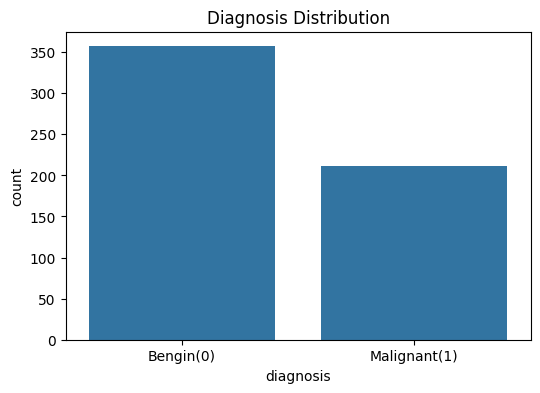

In [44]:
plt.figure(figsize=(6,4))
sns.countplot(x='diagnosis',data=df)
plt.title("Diagnosis Distribution")
plt.xticks([0,1],['Bengin(0)','Malignant(1)'])

Text(0.5, 1.0, 'Feartures correlation heatmap')

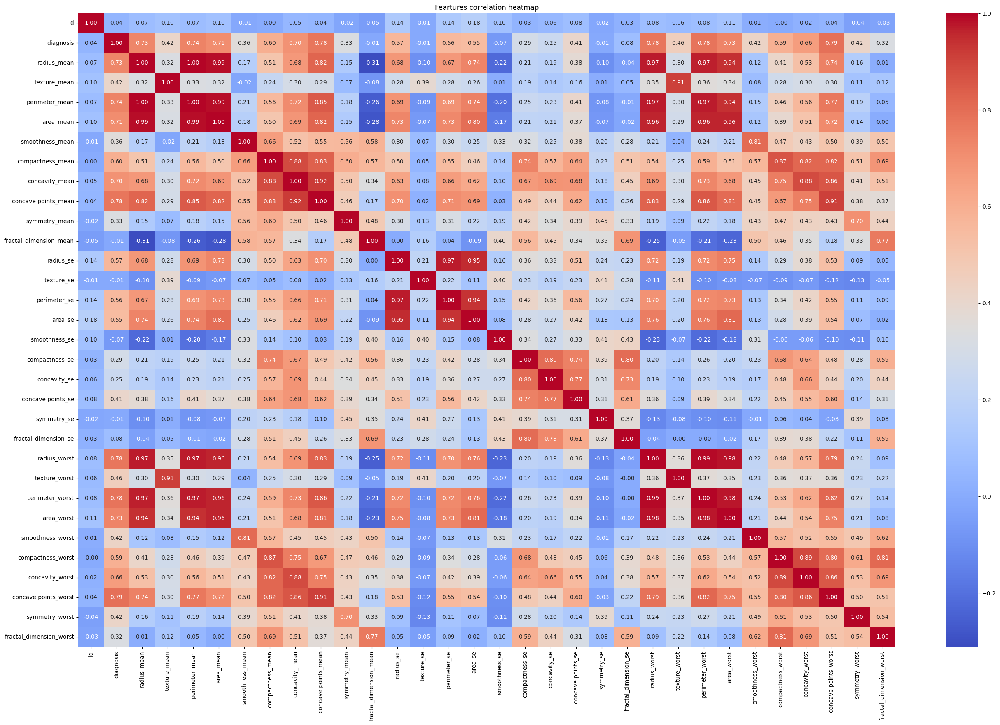

In [45]:
plt.figure(figsize=(32,20))
sns.heatmap(df.corr(),cmap='coolwarm',fmt='.2f',annot=True)
plt.title("Feartures correlation heatmap")

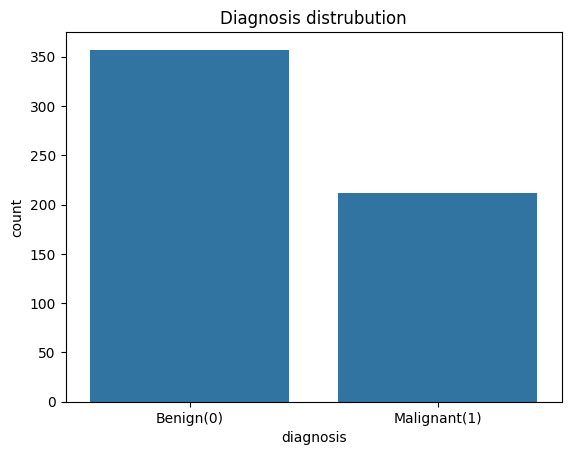

diagnosis
0    62.741652
1    37.258348
Name: proportion, dtype: float64


In [46]:
sns.countplot(x='diagnosis',data=df)
plt.title('Diagnosis distrubution')
plt.xticks([0,1],['Benign(0)','Malignant(1)'])
plt.show()
print(df['diagnosis'].value_counts(normalize=True)*100)

ValueError: num must be an integer with 1 <= num <= 30, not 31

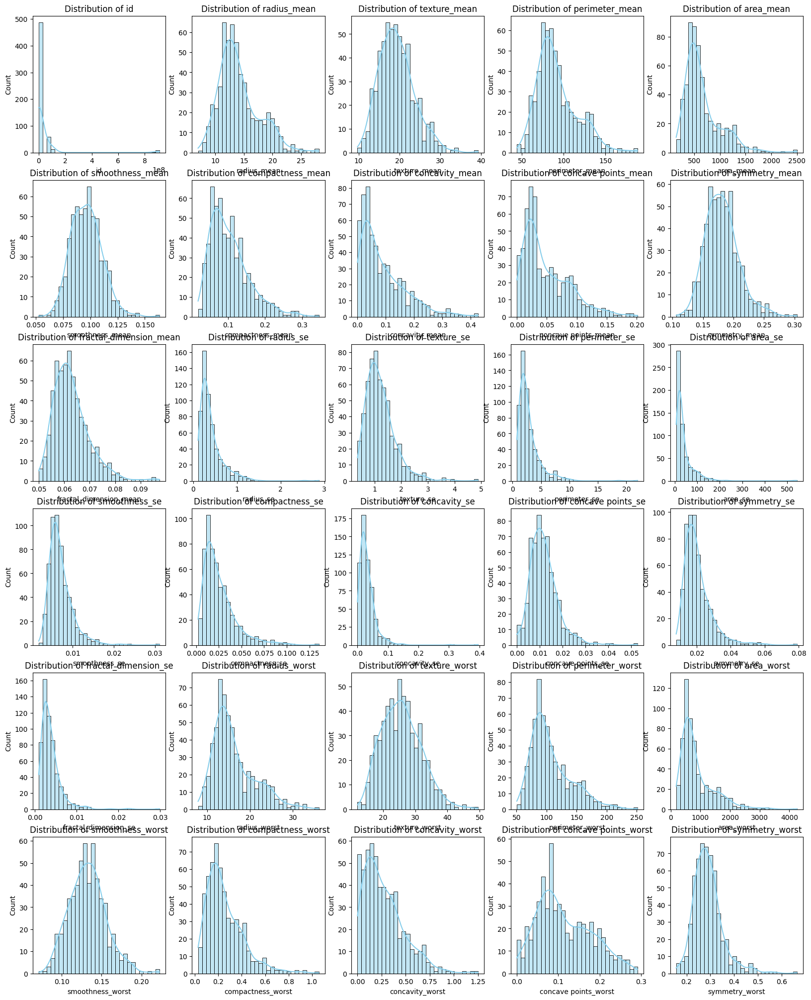

In [47]:
numerical_features= df.drop('diagnosis',axis=1).columns 
plt.figure(figsize=(20,25))
for i, col in enumerate(numerical_features):
    plt.subplot(6,5,i+1)
    sns.histplot(df[col],kde=True,bins=30,color='skyblue')
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

ValueError: num must be an integer with 1 <= num <= 30, not 31

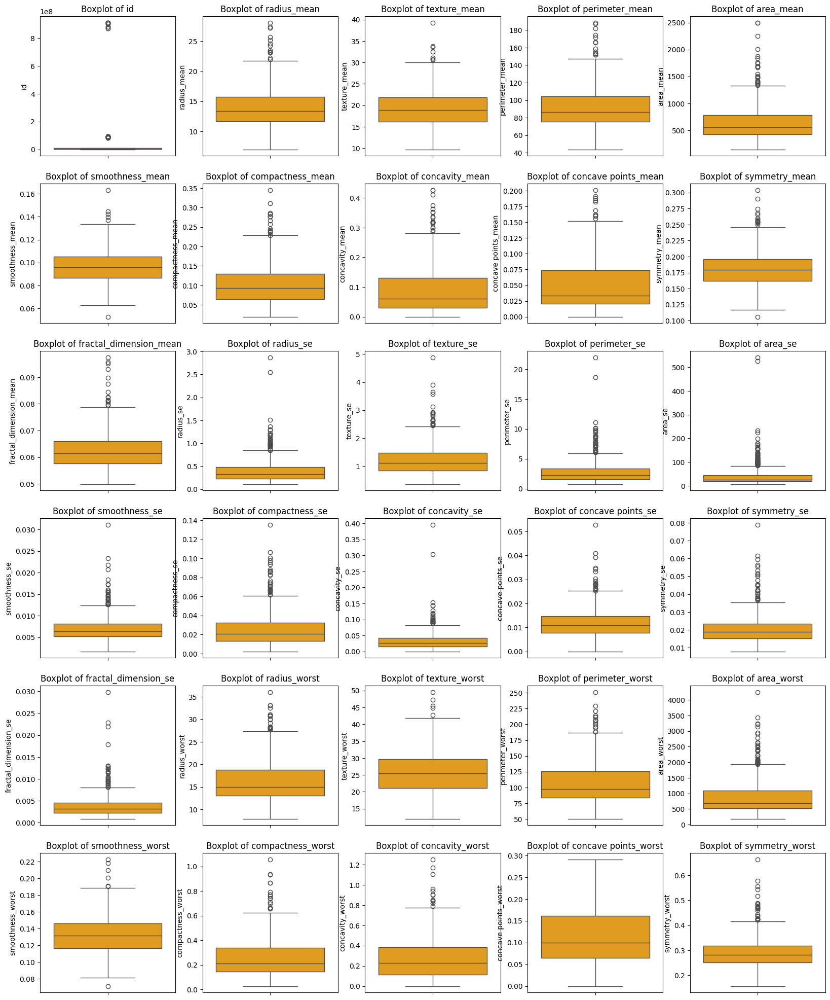

In [ ]:
#Outlier analysis
numerical_features= df.drop('diagnosis',axis=1).columns 
plt.figure(figsize=(20,25))
for i, col in enumerate(numerical_features):
    plt.subplot(6,5,i+1)
    sns.boxplot(y=df[col],color='orange')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

In [ ]:
sample_df=df.sample(100)
sns.pairplot(sample_df,hue='diagnosis',diag_kind='kde')

In [51]:
y = df['diagnosis']
X = df.drop('diagnosis', axis=1)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [52]:
svm_model=SVC(kernel='rbf',random_state=42)
svm_model.fit(X_train_scaled,y_train)
y_pred=svm_model.predict(X_test_scaled)

Accuracy: 0.9825
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



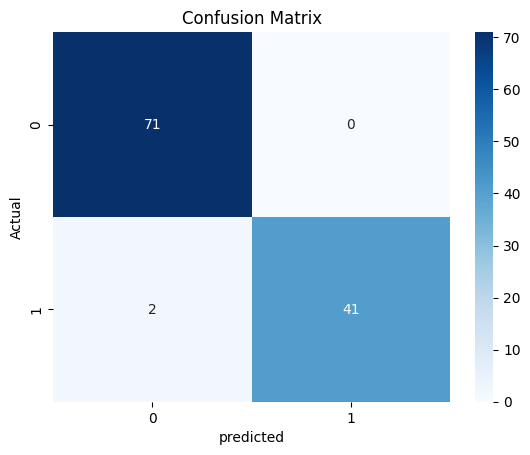

In [65]:
acc=accuracy_score(y_test,y_pred)
print(f"Accuracy: {acc:.4f}")
cm=confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("predicted")
plt.ylabel("Actual")


report=classification_report(y_test,y_pred)
print(report)

plt.savefig(r'C:\Users\Aditi k\OneDrive\Desktop\aditi\courses\ML HCF notes\15 proj\outputs\confusion_matirx_breast_cancer.png')
with open(r'C:\Users\Aditi k\OneDrive\Desktop\aditi\courses\ML HCF notes\15 proj\outputs\classification_report_breast_cancer.txt','w') as doc:
    doc.write(report)

plt.show()

In [66]:
from sklearn.ensemble import RandomForestClassifier
rf_model=RandomForestClassifier(n_estimators=100,random_state=42)
rf_model.fit(X_train_scaled,y_train)
y_pred_rf=rf_model.predict(X_test_scaled)

Random Forest Accuracy: 0.9649


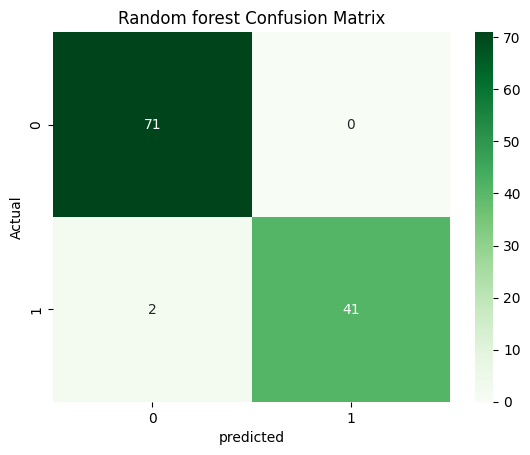

In [67]:
acc_rf=accuracy_score(y_test,y_pred_rf)
print(f"Random Forest Accuracy: {acc_rf:.4f}")

cm_rf=confusion_matrix(y_test,y_pred_rf)
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
plt.title("Random forest Confusion Matrix")
plt.xlabel("predicted")
plt.ylabel("Actual")
plt.show()